# Temperature Forecast Project:

**Statement: This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.**

**Please note that there are two target variables here:**

1) Next_Tmax: Next day maximum temperature

2) Next_Tmin: Next day  minimum temperature

# Importing dataset:

In [22]:
#importing required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt

import warnings
warnings.filterwarnings('ignore')

In [23]:
#To print all columns
pd.set_option('display.max_columns',None)

In [24]:
#importing data
df=pd.read_csv("Temperature Dataset") #Reading csv file
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


**Above is my dataset and below are the features information.**

1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T

**In this perticular problem i have two targets.**

1) Next_Tmax: Next day maximum temperature

2) Next_Tmin: Next day minimum temperature

**Both the target columns are continuous columns so this perticular problem is a Regression problem.**

# EDA:

In [25]:
#Checking shape of dataset
df.shape

(7752, 25)

There are 3956 rows and 25 columns in my dataset.

In [26]:
#Checking all column names
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

Above are the list if column names in the dataset.

In [27]:
#Checking the data types of all columns
df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

Except Date all other columns are float type data.

In [28]:
#Checking the info about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


I can observe in some columns of the dataset i have null values.

In [29]:
#Checking unique values of each column
df.nunique()

station               25
Date                 310
Present_Tmax         167
Present_Tmin         155
LDAPS_RHmin         7672
LDAPS_RHmax         7664
LDAPS_Tmax_lapse    7675
LDAPS_Tmin_lapse    7675
LDAPS_WS            7675
LDAPS_LH            7675
LDAPS_CC1           7569
LDAPS_CC2           7582
LDAPS_CC3           7599
LDAPS_CC4           7524
LDAPS_PPT1          2812
LDAPS_PPT2          2510
LDAPS_PPT3          2356
LDAPS_PPT4          1918
lat                   12
lon                   25
DEM                   25
Slope                 27
Solar radiation     1575
Next_Tmax            183
Next_Tmin            157
dtype: int64

Above are the unique value count of each column.

In [30]:
#Lets check the value count of each column to see if there are any unexpected and unwanted entries present in the column.
for i in df.columns:
        print(df[i].value_counts())
        print('****************************************')

25.0    310
12.0    310
2.0     310
3.0     310
4.0     310
5.0     310
6.0     310
7.0     310
8.0     310
9.0     310
10.0    310
11.0    310
13.0    310
23.0    310
14.0    310
15.0    310
16.0    310
18.0    310
20.0    310
22.0    310
24.0    310
17.0    310
19.0    310
21.0    310
1.0     310
Name: station, dtype: int64
****************************************
13-08-2017    25
22-08-2014    25
23-08-2013    25
21-08-2016    25
27-07-2016    25
              ..
04-07-2017    25
17-07-2015    25
13-07-2014    25
08-07-2015    25
24-08-2017    25
Name: Date, Length: 310, dtype: int64
****************************************
31.4    112
29.4    111
29.1    108
29.7    107
30.6    105
       ... 
36.4      1
20.7      1
20.4      1
20.3      1
21.2      1
Name: Present_Tmax, Length: 167, dtype: int64
****************************************
24.0    161
23.8    153
23.1    144
23.5    143
23.3    142
       ... 
13.5      1
15.0      1
13.6      1
14.2      1
29.6      1
Name: Present_

Above are the value counts of each columns.In LDAPS_CC2 column, LDAPS_CC3, LDAPS_CC4, LDAPS_PPT1, LDAPS_PPT2, LDAPS_PPT3 and LDAPS_PPT4 columns there are more zero values.

**I tried replacing zeros in LDAPS_PPT1, LDAPS_PPT1, LDAPS_PPT2, LDAPS_PPT3, LDAPS_PPT4 but the accuracy of the model reduced which means these zero inputs are important for model building so i'm keeping them as it is.**

In [31]:
#Checking null values in the dataset
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

I can see null values in all the columns except lat, lon, DEM, Slope, Solar radiation colums.And i can notice in station and Date column there are only two null values so let me have a look into unique count of those columns.

In [32]:
#lets check the unique values in station column
df['station'].unique()

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25., nan])

In [33]:
#lets check the unique values in Date column
df['Date'].unique()

array(['30-06-2013', '01-07-2013', '02-07-2013', '03-07-2013',
       '04-07-2013', '05-07-2013', '06-07-2013', '07-07-2013',
       '08-07-2013', '09-07-2013', '10-07-2013', '11-07-2013',
       '12-07-2013', '13-07-2013', '14-07-2013', '15-07-2013',
       '16-07-2013', '17-07-2013', '18-07-2013', '19-07-2013',
       '20-07-2013', '21-07-2013', '22-07-2013', '23-07-2013',
       '24-07-2013', '25-07-2013', '26-07-2013', '27-07-2013',
       '28-07-2013', '29-07-2013', '30-07-2013', '31-07-2013',
       '01-08-2013', '02-08-2013', '03-08-2013', '04-08-2013',
       '05-08-2013', '06-08-2013', '07-08-2013', '08-08-2013',
       '09-08-2013', '10-08-2013', '11-08-2013', '12-08-2013',
       '13-08-2013', '14-08-2013', '15-08-2013', '16-08-2013',
       '17-08-2013', '18-08-2013', '19-08-2013', '20-08-2013',
       '21-08-2013', '22-08-2013', '23-08-2013', '24-08-2013',
       '25-08-2013', '26-08-2013', '27-08-2013', '28-08-2013',
       '29-08-2013', '30-08-2013', '30-06-2014', '01-07

So it looks like the data is collected for about 25 stations and the last 2 entries are nan values,so i can replace them with station 1 and 2 considering the entries of next day.And the nan value in Date column can be replaced by continuation of dates like 31-08-2017. 

In [34]:
# Lets replace the null values in station column
df['station'].iloc[7750] = 1.0
df['station'].iloc[7751] = 2.0

In [35]:
#lets replace null values in 'Date' column
df['Date'].iloc[7750] = '31-08-2017'
df['Date'].iloc[7751] = '31-08-2017'

# Feature Engineering:

In [36]:
df["Date"]=pd.to_datetime(df["Date"])

In [37]:
#Extracting Year, month and date from Date column
df["Year"]=df["Date"].dt.year
df["Month"]=df["Date"].dt.month
df["Day"]=df["Date"].dt.day

Succesfully extracted date, month and year from Date column.

In [38]:
#Printing dataset
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Year,Month,Day
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,2013,6,30
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,2013,6,30
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,2013,6,30
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,2013,6,30
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,2013,6,30


After extraction i can drop Date column.

In [39]:
#Droping Date column
df = df.drop(["Date"],axis=1)

In [40]:
#Checking null values in the dataset
df.isnull().sum()

station              0
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
Year                 0
Month                0
Day                  0
dtype: int64

So the nan values in station and Date column are replaced.Let me replace nan values in other columns. 

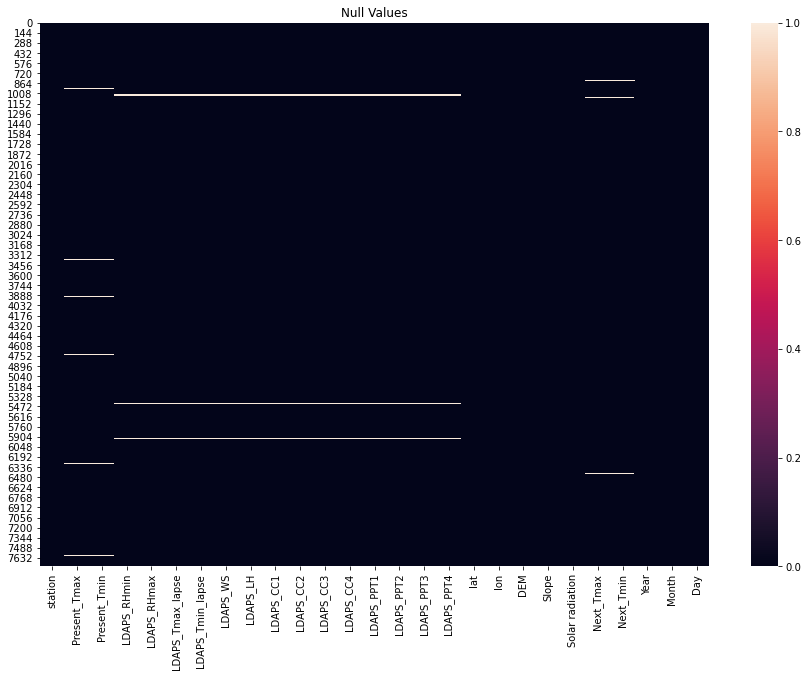

In [41]:
#Visualizeing null values
plt.figure(figsize=[15,10])
sns.heatmap(df.isnull())
plt.title("Null Values")
plt.show()

I can see the null values clearly now.

# Imputaion method to replace nan values:

In [42]:
#Checking for skewness
df.skew()

station             0.000182
Present_Tmax       -0.262942
Present_Tmin       -0.365875
LDAPS_RHmin         0.298765
LDAPS_RHmax        -0.850870
LDAPS_Tmax_lapse   -0.226775
LDAPS_Tmin_lapse   -0.578943
LDAPS_WS            1.571581
LDAPS_LH            0.670491
LDAPS_CC1           0.457231
LDAPS_CC2           0.470060
LDAPS_CC3           0.637630
LDAPS_CC4           0.663251
LDAPS_PPT1          5.367675
LDAPS_PPT2          5.747360
LDAPS_PPT3          6.425829
LDAPS_PPT4          6.792379
lat                 0.087062
lon                -0.285213
DEM                 1.723257
Slope               1.563020
Solar radiation    -0.511210
Next_Tmax          -0.339607
Next_Tmin          -0.403743
Year               -0.000365
Month              -0.705586
Day                 0.245283
dtype: float64

In [43]:
#Replacing nan values in columns having skewness
df["LDAPS_RHmax"] = df["LDAPS_RHmax"].fillna(df["LDAPS_RHmax"].median())
df["LDAPS_Tmin_lapse"] = df["LDAPS_Tmin_lapse"].fillna(df["LDAPS_Tmin_lapse"].median())
df["LDAPS_WS"] = df["LDAPS_WS"].fillna(df["LDAPS_WS"].median())
df["LDAPS_LH"] = df["LDAPS_LH"].fillna(df["LDAPS_LH"].median())
df["LDAPS_CC3"] = df["LDAPS_CC3"].fillna(df["LDAPS_CC3"].median())
df["LDAPS_CC4"] = df["LDAPS_CC4"].fillna(df["LDAPS_CC4"].median())
df["LDAPS_PPT1"] = df["LDAPS_PPT1"].fillna(df["LDAPS_PPT1"].median())
df["LDAPS_PPT2"] = df["LDAPS_PPT2"].fillna(df["LDAPS_PPT2"].median())
df["LDAPS_PPT3"] = df["LDAPS_PPT3"].fillna(df["LDAPS_PPT3"].median())
df["LDAPS_PPT4"] = df["LDAPS_PPT4"].fillna(df["LDAPS_PPT4"].median())

In [44]:
#Replacing nan values in columns without skewness
df["Present_Tmax"] = df["Present_Tmax"].fillna(df["Present_Tmax"].mean())
df["Present_Tmin"] = df["Present_Tmin"].fillna(df["Present_Tmin"].mean())
df["LDAPS_RHmin"] = df["LDAPS_RHmin"].fillna(df["LDAPS_RHmin"].mean())
df["LDAPS_Tmax_lapse"] = df["LDAPS_Tmax_lapse"].fillna(df["LDAPS_Tmax_lapse"].mean())
df["LDAPS_CC1"] = df["LDAPS_CC1"].fillna(df["LDAPS_CC1"].mean())
df["LDAPS_CC2"] = df["LDAPS_CC2"].fillna(df["LDAPS_CC2"].mean())
df["Next_Tmax"] = df["Next_Tmax"].fillna(df["Next_Tmax"].mean())
df["Next_Tmin"] = df["Next_Tmin"].fillna(df["Next_Tmin"].mean())

I have replaced all the nan values.

In [45]:
#Checking null values in the dataset again
df.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
Year                0
Month               0
Day                 0
dtype: int64

Now all the null values has been replaced.

**If the column entries in the dataset are consecutive it will create problem while building the model so let me shuffel the data.**

In [46]:
#Shuffeling the dataset
from sklearn.utils import shuffle
df = shuffle(df)
df.reset_index(inplace = True)
df

,index,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Year,Month,Day
0,6043,19.0,31.7,24.7,48.834045,85.030304,30.773949,25.781946,6.610783,56.302078,0.051768,0.067146,0.155294,0.717747,0.000000,0.000000,0.000000,0.004307,37.5776,126.938,75.0924,1.7678,4688.676758,32.7,22.3,2016,8,24
1,4411,12.0,27.7,21.6,36.086815,91.543709,30.049665,23.567009,6.788758,38.523865,0.341985,0.311973,0.137075,0.141593,0.046281,0.266010,0.000000,0.000000,37.5507,126.988,132.1180,0.5931,4846.348145,30.2,21.9,2015,8,21
2,4103,4.0,31.2,23.4,59.358318,95.068771,29.791518,23.198186,6.496327,80.969690,0.245756,0.546184,0.149912,0.091986,0.000000,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.5348,5176.915039,32.7,23.8,2015,9,8
3,5224,25.0,34.5,26.3,57.756775,74.470039,30.632499,26.656024,6.646242,35.652668,0.504939,0.731712,0.602711,0.519998,0.004158,0.448597,0.149355,0.000000,37.5237,126.970,19.5844,0.2713,5582.903320,32.6,27.6,2016,7,22
4,1552,3.0,29.1,21.8,35.344284,71.172989,32.802626,22.727865,6.207204,13.528104,0.046594,0.056694,0.108667,0.104567,0.000000,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.2661,5863.555664,31.6,21.4,2014,6,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,5886,12.0,33.6,25.1,53.118893,73.021370,31.770596,27.132052,6.160046,18.423779,0.198010,0.278383,0.558652,0.602517,0.000000,0.000000,0.000000,0.000000,37.5507,126.988,132.1180,0.5931,4917.222168,32.6,24.5,2016,8,18
7748,6173,24.0,27.8,18.8,59.649101,88.240540,22.284882,17.244322,13.030418,67.656189,0.175132,0.168677,0.693451,0.844669,0.000000,0.000000,0.101510,0.301330,37.5237,126.909,17.2956,0.2223,4438.373535,25.1,19.7,2016,8,29
7749,4292,18.0,32.6,21.3,32.352962,92.233208,32.830520,20.958564,5.617035,113.947480,0.054751,0.011718,0.036071,0.151843,0.000000,0.000000,0.000000,0.000000,37.4832,127.024,56.4448,1.2313,4953.190918,35.0,20.8,2015,8,16
7750,1338,14.0,32.9,26.2,62.344208,92.529625,30.561752,24.965483,4.716954,60.020884,0.787387,0.844352,0.675192,0.109826,6.186932,1.906663,0.429576,0.000000,37.4967,126.927,30.9680,0.6180,4750.348633,29.0,22.2,2013,8,22


This is the dataset after shuffeling.

In [47]:
#lets drop the index column
df.drop(columns = 'index', inplace = True)

In [48]:
df.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Year,Month,Day
0,19.0,31.7,24.7,48.834045,85.030304,30.773949,25.781946,6.610783,56.302078,0.051768,0.067146,0.155294,0.717747,0.000000,0.000000,0.000000,0.004307,37.5776,126.938,75.0924,1.7678,4688.676758,32.7,22.3,2016,8,24
1,12.0,27.7,21.6,36.086815,91.543709,30.049665,23.567009,6.788758,38.523865,0.341985,0.311973,0.137075,0.141593,0.046281,0.266010,0.000000,0.000000,37.5507,126.988,132.1180,0.5931,4846.348145,30.2,21.9,2015,8,21
2,4.0,31.2,23.4,59.358318,95.068771,29.791518,23.198186,6.496327,80.969690,0.245756,0.546184,0.149912,0.091986,0.000000,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.5348,5176.915039,32.7,23.8,2015,9,8
3,25.0,34.5,26.3,57.756775,74.470039,30.632499,26.656024,6.646242,35.652668,0.504939,0.731712,0.602711,0.519998,0.004158,0.448597,0.149355,0.000000,37.5237,126.970,19.5844,0.2713,5582.903320,32.6,27.6,2016,7,22
4,3.0,29.1,21.8,35.344284,71.172989,32.802626,22.727865,6.207204,13.528104,0.046594,0.056694,0.108667,0.104567,0.000000,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.2661,5863.555664,31.6,21.4,2014,6,30


In [49]:
#Checking for empty observations
df.loc[df['Next_Tmax'] == " "]

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Year,Month,Day


There is no empty observation in Next_Tmax column.

In [50]:
#Checking for empty observations
df.loc[df['Next_Tmin'] == " "]

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Year,Month,Day


There is no empty observation in Next_Tmax column.

In [51]:
#Checking description of data set
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Year,Month,Day
count,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000
mean,12.997033,29.768211,23.225059,56.759372,88.388529,29.613447,23.514984,7.092549,62.450457,0.368774,0.356080,0.317864,0.298499,0.586267,0.480310,0.275508,0.266801,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220,2015.000516,7.080882,16.374742
std,7.213007,2.956557,2.403036,14.596973,7.158471,2.932898,2.334099,2.173913,33.571540,0.261185,0.256810,0.249208,0.253211,1.937198,1.754900,1.156495,1.200654,0.050352,0.079435,54.279780,1.370444,429.158867,3.122557,2.483276,1.414487,2.238124,8.243617
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000,2013.000000,1.000000,7.000000
25%,7.000000,27.800000,21.700000,46.046162,84.316923,27.693091,22.114651,5.686487,37.532764,0.148321,0.142328,0.103100,0.082741,0.000000,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.400000,2014.000000,7.000000,8.000000
50%,13.000000,29.900000,23.400000,55.313244,89.793480,29.662273,23.760199,6.547470,56.865482,0.320110,0.315667,0.262555,0.227664,0.000000,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000,2015.000000,7.000000,16.000000
75%,19.000000,32.000000,24.900000,67.038254,93.704500,31.683819,25.134000,8.007471,83.904586,0.571696,0.554963,0.494007,0.497230,0.049122,0.016748,0.007231,0.000000,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000,2016.000000,8.000000,24.000000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000,2017.000000,12.000000,31.000000


Above is the statistics about the dataset.The mean and the 2nd quantile values are almost same so there is no extreme outliers in the dataset.

# Visualization:

# Univariate Analysis:

In [52]:
# checking for categorical columns
categorical_columns=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_columns.append(i)
print(categorical_columns)

[]


There is no categorical column in the dataset.

In [53]:
# Now checking for numerical columns
numerical_columns=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_columns.append(i)
print(numerical_columns)

['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Year', 'Month', 'Day']


Above all are numerical columns so let me replace the nan values with median if there is skewness and mean if there is no skewness. 

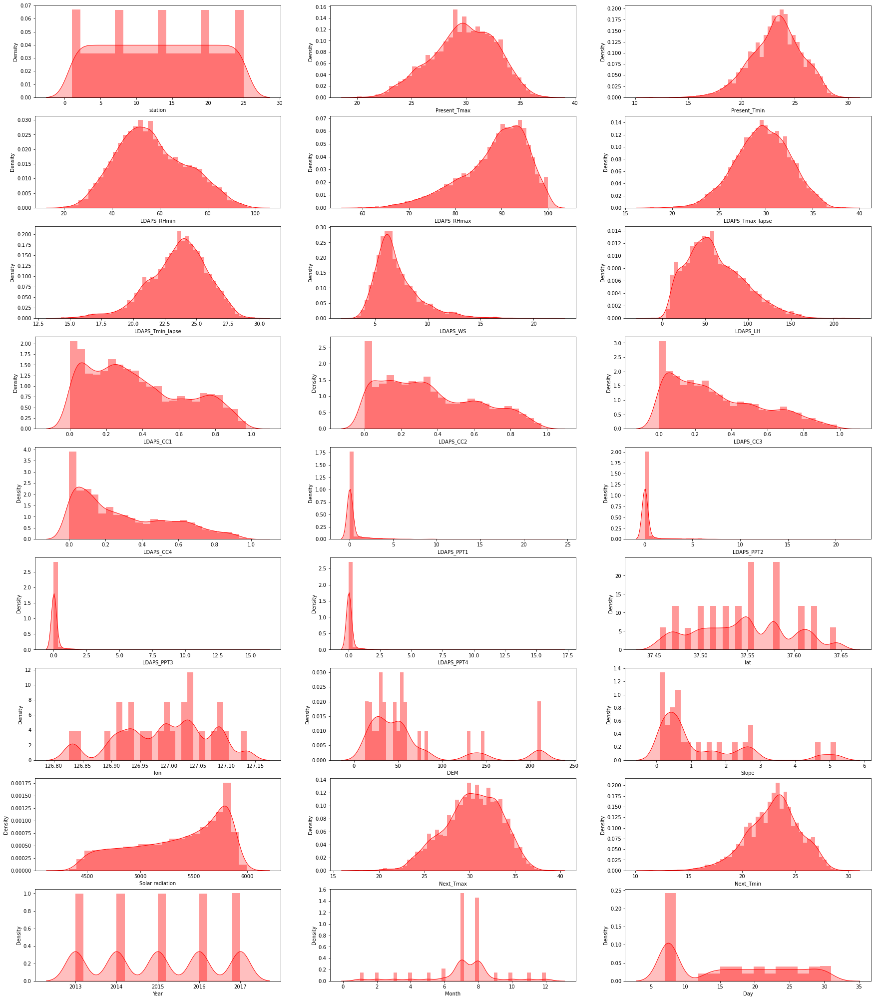

In [54]:
#Distribution plot for all numerical columns
plt.figure(figsize=(30,40), facecolor='white')
plotnumber = 1

for column in df[numerical_columns]:
    if plotnumber<=30:
        ax = plt.subplot(10,3,plotnumber)
        sns.distplot(df[column],color='r',kde_kws={"shade": True},hist=True)
        plt.xlabel(column,fontsize=10)
    plotnumber+=1
plt.show()

Above are the dist plots all the columns, I can observe there is skewness in most of the columns i have remove that.

# Bivariate Analysis:

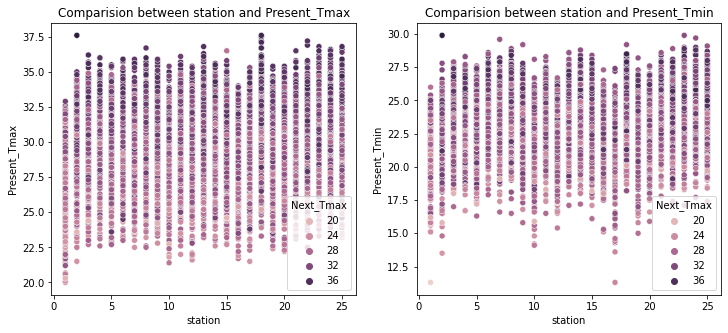

In [55]:
#Comparision between features using scatter plot
plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between station and Present_Tmax')
sns.scatterplot(df['station'],df['Present_Tmax'],hue=df['Next_Tmax']);
plt.subplot(1, 2, 2)
plt.title('Comparision between station and Present_Tmin')
sns.scatterplot(df['station'],df['Present_Tmin'],hue=df['Next_Tmax']);
plt.show()

- In the above plot i can see that as the Present_Tmax is increasing the Next_Tmax is also increasing irrespective of station.
- And also in 2nd plot as Present_Tmin is increasing then Next_Tmax is also increasing.

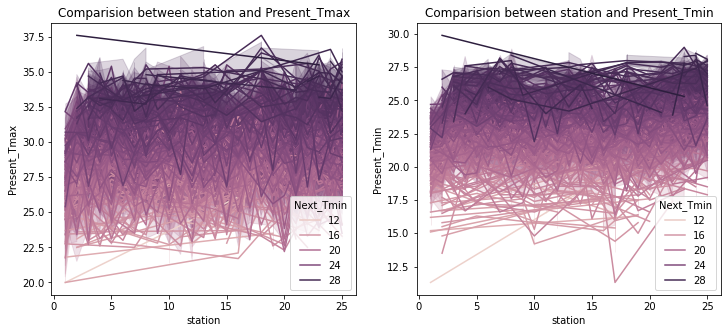

In [56]:
#Comparision between features using line plot
plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between station and Present_Tmax')
sns.lineplot(df['station'],df['Present_Tmax'],hue=df['Next_Tmin']);
plt.subplot(1, 2, 2)
plt.title('Comparision between station and Present_Tmin')
sns.lineplot(df['station'],df['Present_Tmin'],hue=df['Next_Tmin']);
plt.show()

- The graph is almost irregular but I can observe dark purple color in the range of 30 to 35 in Present_Tmax and Present_Tmin which means Next_Tmin is more here in all the stations.

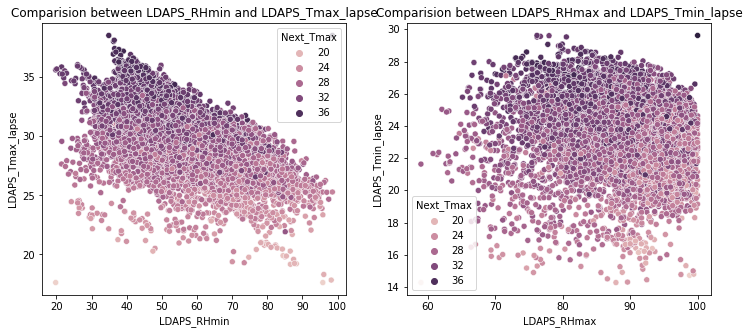

In [57]:
#Comparision between features using scatter plot
plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between LDAPS_RHmin and LDAPS_Tmax_lapse')
sns.scatterplot(df['LDAPS_RHmin'],df['LDAPS_Tmax_lapse'],hue=df['Next_Tmax']);
plt.subplot(1, 2, 2)
plt.title('Comparision between LDAPS_RHmax and LDAPS_Tmin_lapse')
sns.scatterplot(df['LDAPS_RHmax'],df['LDAPS_Tmin_lapse'],hue=df['Next_Tmax']);
plt.show()

- In first plot i can observe a linear decrese in lapse with RHmin and also Next_Tmax is also decresing with the curve.
- In second plot no proper pattern is observed.

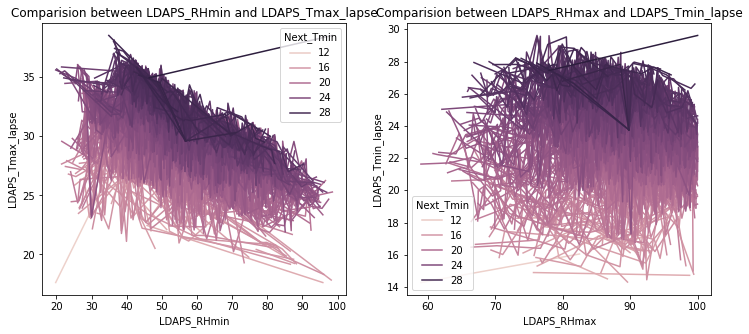

In [58]:
#Comparision between features using line plot
plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between LDAPS_RHmin and LDAPS_Tmax_lapse')
sns.lineplot(df['LDAPS_RHmin'],df['LDAPS_Tmax_lapse'],hue=df['Next_Tmin']);
plt.subplot(1, 2, 2)
plt.title('Comparision between LDAPS_RHmax and LDAPS_Tmin_lapse')
sns.lineplot(df['LDAPS_RHmax'],df['LDAPS_Tmin_lapse'],hue=df['Next_Tmin']);
plt.show()

- In both the graphs there are some outliers.
- The color is getting dark as lapse and RHmax is incresing in 2nd graph.
- In first graph it is showing linear decreseing curve.

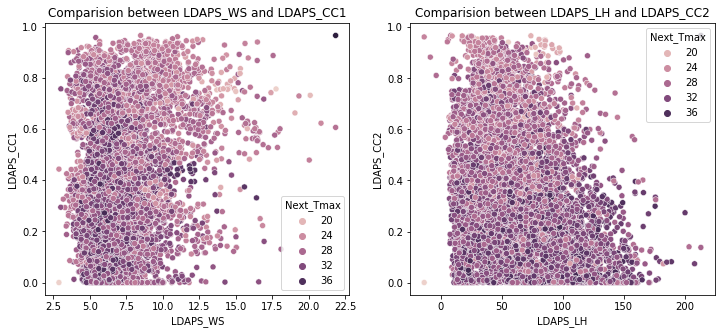

In [59]:
#Comparision between features using scatter plot
plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between LDAPS_WS and LDAPS_CC1')
sns.scatterplot(df['LDAPS_WS'],df['LDAPS_CC1'],hue=df['Next_Tmax']);
plt.subplot(1, 2, 2)
plt.title('Comparision between LDAPS_LH and LDAPS_CC2')
sns.scatterplot(df['LDAPS_LH'],df['LDAPS_CC2'],hue=df['Next_Tmax']);
plt.show()

- In this perticular plot most of the points are lying between 5-10 LDAPS_WS and in LDAPS_LH 0-150.
- But no proper pattern is observed.

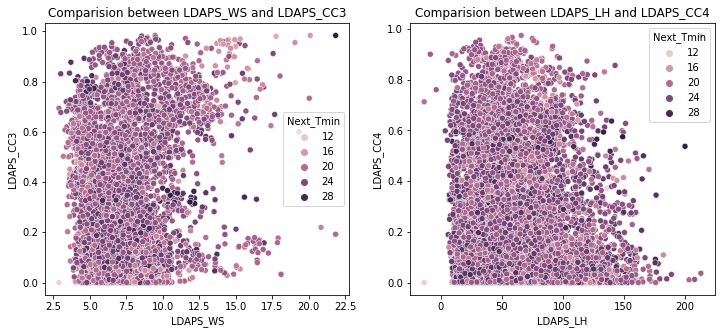

In [60]:
#Comparision between features using scatter plot
plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between LDAPS_WS and LDAPS_CC3')
sns.scatterplot(df['LDAPS_WS'],df['LDAPS_CC3'],hue=df['Next_Tmin']);
plt.subplot(1, 2, 2)
plt.title('Comparision between LDAPS_LH and LDAPS_CC4')
sns.scatterplot(df['LDAPS_LH'],df['LDAPS_CC4'],hue=df['Next_Tmin']);
plt.show()

- In this perticular plot most of the points are lying between 5-10 LDAPS_WS and in LDAPS_LH 0-150.
- But no proper pattern is observed.

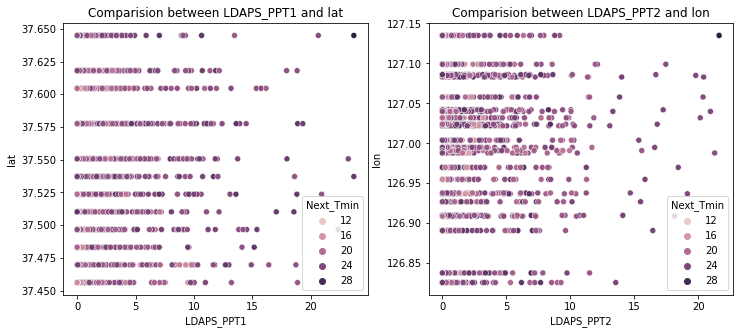

In [61]:
#Comparision between features using scatter plot
plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between LDAPS_PPT1 and lat')
sns.scatterplot(df['LDAPS_PPT1'],df['lat'],hue=df['Next_Tmin']);
plt.subplot(1, 2, 2)
plt.title('Comparision between LDAPS_PPT2 and lon')
sns.scatterplot(df['LDAPS_PPT2'],df['lon'],hue=df['Next_Tmin']);
plt.show()

In this graph also i can not observe any patterens.

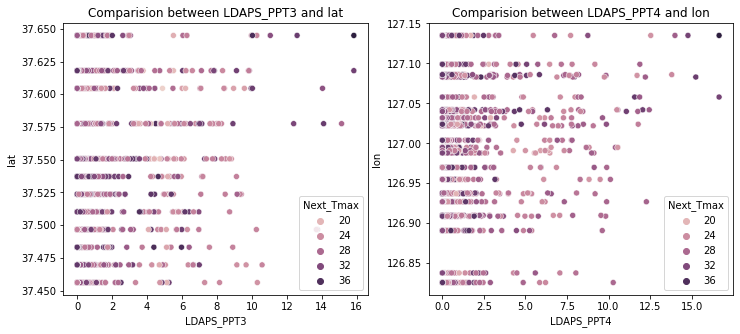

In [62]:
#Comparision between features using scatter plot
plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between LDAPS_PPT3 and lat')
sns.scatterplot(df['LDAPS_PPT3'],df['lat'],hue=df['Next_Tmax']);
plt.subplot(1, 2, 2)
plt.title('Comparision between LDAPS_PPT4 and lon')
sns.scatterplot(df['LDAPS_PPT4'],df['lon'],hue=df['Next_Tmax']);
plt.show()

- I can say that lat and lon are just geometrical features they do not have any proper relationship with our features.

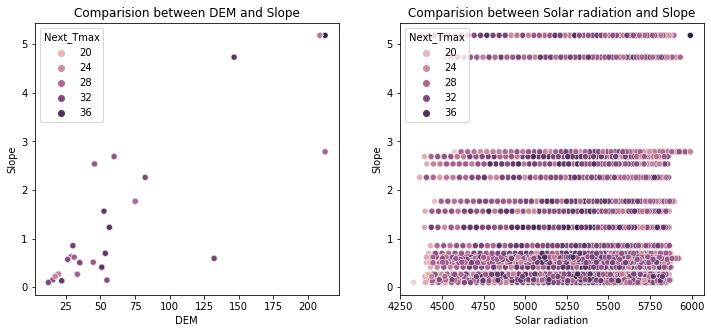

In [63]:
#Comparision between features using scatter plot
plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between DEM and Slope')
sns.scatterplot(df['DEM'],df['Slope'],hue=df['Next_Tmax']);
plt.subplot(1, 2, 2)
plt.title('Comparision between Solar radiation and Slope')
sns.scatterplot(df['Solar radiation'],df['Slope'],hue=df['Next_Tmax']);
plt.show()

- In first plot there is no patteren at all.
- In 2nd plot I can notice that there is no solar radiation in between the slope 3 to 4.5.

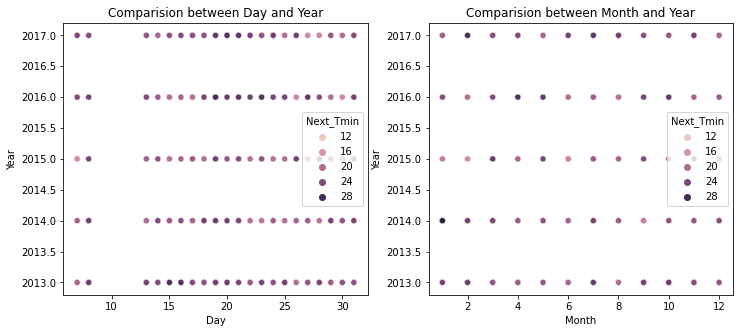

In [64]:
#Comparision between features using scatter plot
plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between Day and Year')
sns.scatterplot(df['Day'],df['Year'],hue=df['Next_Tmin']);
plt.subplot(1, 2, 2)
plt.title('Comparision between Month and Year')
sns.scatterplot(df['Month'],df['Year'],hue=df['Next_Tmin']);
plt.show()

- In first graph i can notice that 6 to 13 day there is no temperature noted.
- In second graph it looks setteled.

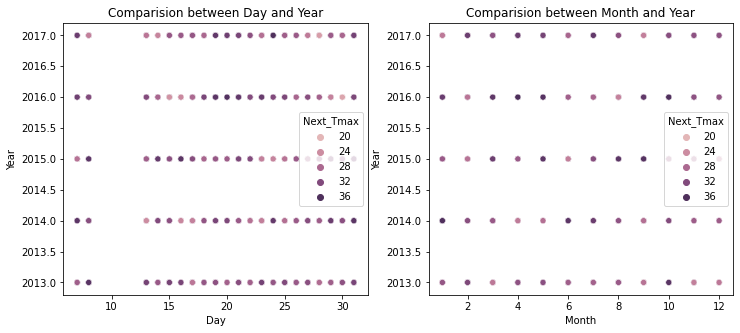

In [65]:
#Comparision between features using scatter plot
plt.figure(figsize=(12,5))
plt.subplot(1, 2, 1)
plt.title('Comparision between Day and Year')
sns.scatterplot(df['Day'],df['Year'],hue=df['Next_Tmax']);
plt.subplot(1, 2, 2)
plt.title('Comparision between Month and Year')
sns.scatterplot(df['Month'],df['Year'],hue=df['Next_Tmax']);
plt.show()

- In first graph i can notice that 6 to 13 day there is no temperature noted.
- In second graph it looks setteled.

# Multivariate Analysis:

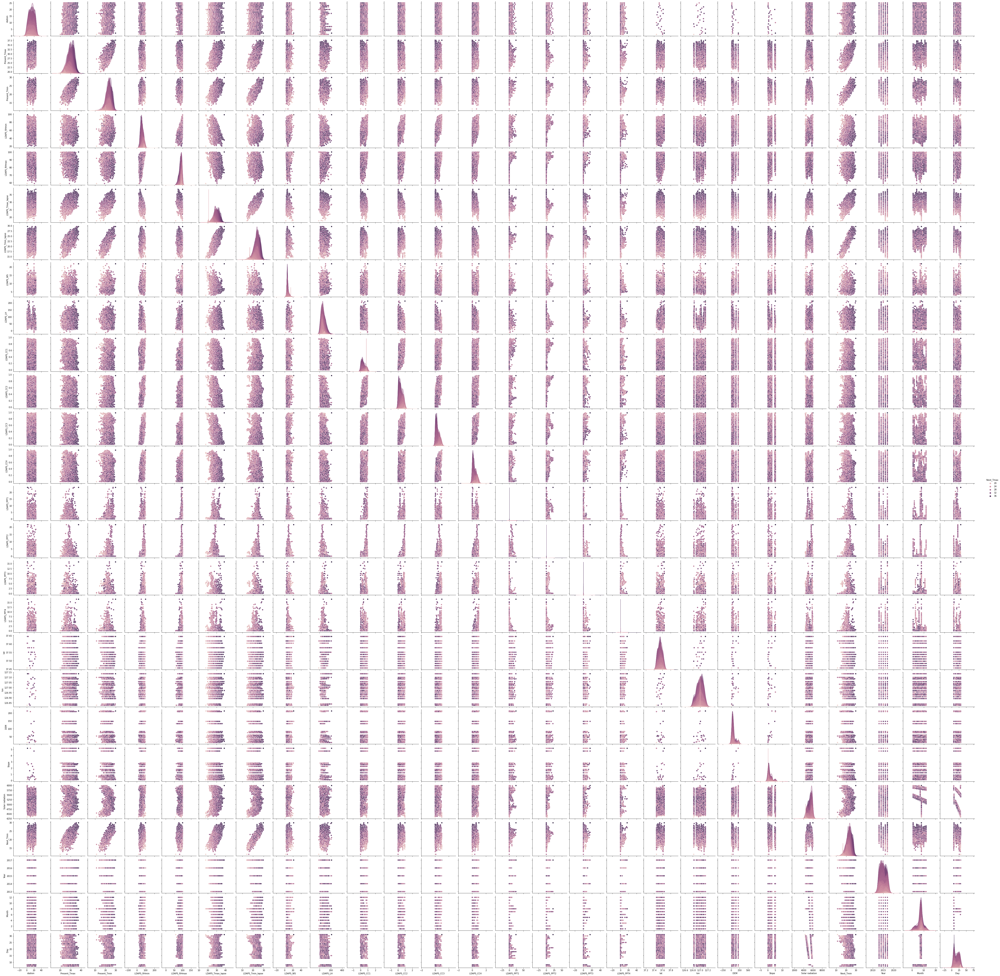

In [66]:
#pair ploting for df
sns.pairplot(df,hue="Next_Tmax")

Above are the pair plots of pair of features for Next_Tmax as target.And i can say that there are outliers in the dataset. 

# Checking for outliers:

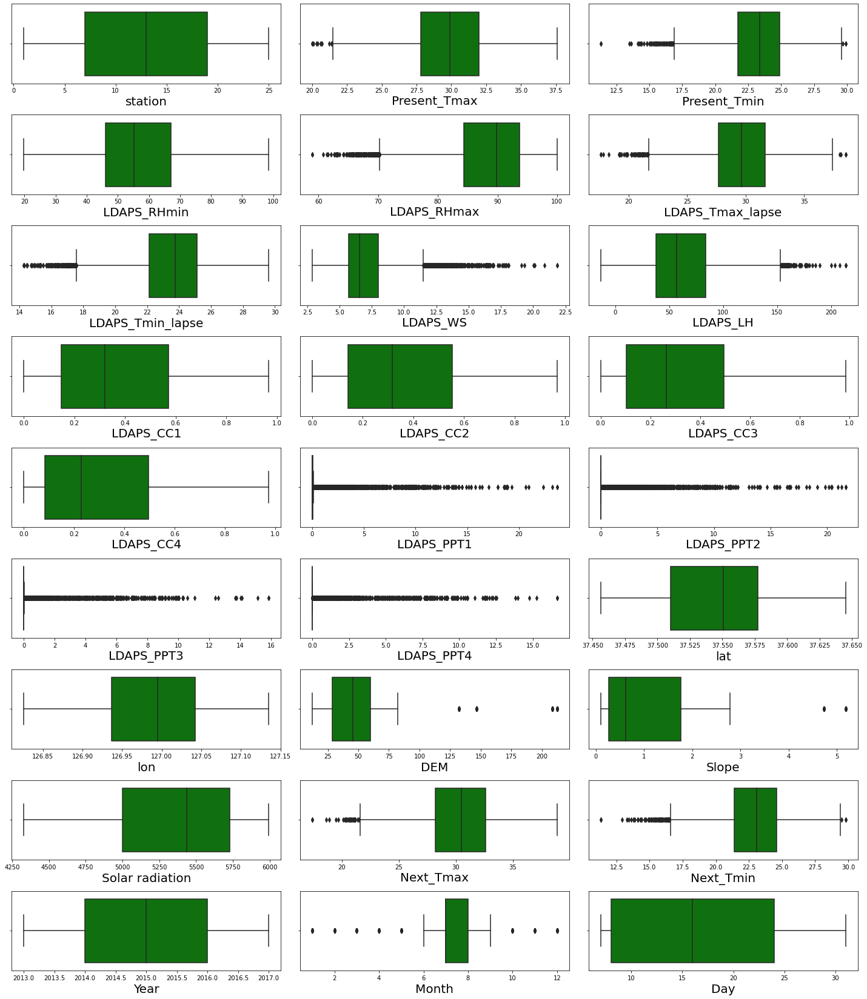

In [67]:
# Identifying the outliers using boxplot

plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for column in numerical_columns:
    if plotnumber<=30:
        ax=plt.subplot(10,3,plotnumber)
        sns.boxplot(df[column],color='g')
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

There are outliers in:
- Present_Tmax
- Present_Tmin
- LDAPS_RHmax
- LDAPS_Tmax_lapse
- LDAPS_Tmin_lapse
- LDAPS_WS
- LDAPS_LH
- LDAPS_PPT1
- LDAPS_PPT2
- LDAPS_PPT3
- LDAPS_PPT4
- DEM
- Slope
- Month
- Next_Tmax
- Next_Tmin


**But i should not remove outliers in target column.**

# Removing outliers:

# i) Zscore Method:

In [68]:
#Features having outliers
features=df[['Present_Tmax','Present_Tmin','LDAPS_RHmax','LDAPS_Tmax_lapse','LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_LH','LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4','DEM','Slope','Month']]

Above are the list of columns with outliers.

In [69]:
from scipy.stats import zscore
z=np.abs(zscore(features))
df_new=df[(z<3).all(axis=1)]
df_new

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Year,Month,Day
0,19.0,31.7,24.7,48.834045,85.030304,30.773949,25.781946,6.610783,56.302078,0.051768,0.067146,0.155294,0.717747,0.000000,0.000000,0.000000,0.004307,37.5776,126.938,75.0924,1.7678,4688.676758,32.7,22.3,2016,8,24
1,12.0,27.7,21.6,36.086815,91.543709,30.049665,23.567009,6.788758,38.523865,0.341985,0.311973,0.137075,0.141593,0.046281,0.266010,0.000000,0.000000,37.5507,126.988,132.1180,0.5931,4846.348145,30.2,21.9,2015,8,21
2,4.0,31.2,23.4,59.358318,95.068771,29.791518,23.198186,6.496327,80.969690,0.245756,0.546184,0.149912,0.091986,0.000000,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.5348,5176.915039,32.7,23.8,2015,9,8
3,25.0,34.5,26.3,57.756775,74.470039,30.632499,26.656024,6.646242,35.652668,0.504939,0.731712,0.602711,0.519998,0.004158,0.448597,0.149355,0.000000,37.5237,126.970,19.5844,0.2713,5582.903320,32.6,27.6,2016,7,22
4,3.0,29.1,21.8,35.344284,71.172989,32.802626,22.727865,6.207204,13.528104,0.046594,0.056694,0.108667,0.104567,0.000000,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.2661,5863.555664,31.6,21.4,2014,6,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,12.0,33.6,25.1,53.118893,73.021370,31.770596,27.132052,6.160046,18.423779,0.198010,0.278383,0.558652,0.602517,0.000000,0.000000,0.000000,0.000000,37.5507,126.988,132.1180,0.5931,4917.222168,32.6,24.5,2016,8,18
7748,24.0,27.8,18.8,59.649101,88.240540,22.284882,17.244322,13.030418,67.656189,0.175132,0.168677,0.693451,0.844669,0.000000,0.000000,0.101510,0.301330,37.5237,126.909,17.2956,0.2223,4438.373535,25.1,19.7,2016,8,29
7749,18.0,32.6,21.3,32.352962,92.233208,32.830520,20.958564,5.617035,113.947480,0.054751,0.011718,0.036071,0.151843,0.000000,0.000000,0.000000,0.000000,37.4832,127.024,56.4448,1.2313,4953.190918,35.0,20.8,2015,8,16
7750,14.0,32.9,26.2,62.344208,92.529625,30.561752,24.965483,4.716954,60.020884,0.787387,0.844352,0.675192,0.109826,6.186932,1.906663,0.429576,0.000000,37.4967,126.927,30.9680,0.6180,4750.348633,29.0,22.2,2013,8,22


I have removed the skewness using zscore method.

In [70]:
#Checking shape of new dataset
df_new.shape

(6907, 27)

In my new dataset i have 6907 rows and 27 columns.

In [71]:
#Checking shape of old dataset
df.shape

(7752, 27)

In my old dataset i was having 7752 rows and 27 columns.

In [72]:
#Checking dataloss in zscore method
Dataloss = (((7752-6907)/7752)*100)
Dataloss

10.900412796697626

Using zscore i'm getting 10.90% dataloss.So let me not remove any outliers from the dataset.But still let me have a look into IQR method also.

# ii) IQR method:

In [73]:
# 1st quantile
Q1=features.quantile(0.25)

# 3rd quantile
Q3=features.quantile(0.75)

# IQR
IQR=Q3 - Q1

df_1=df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]

I have removed the skewness using IQR method.

In [74]:
#Checking shape of new dataset
df_1.shape

(2413, 27)

In my new dataset i have 2413 rows and 27 columns.

In [75]:
#Checking shape of old dataset
df.shape

(7752, 27)

In my old dataset i was having 7752 rows and 27 columns.

In [76]:
#Checking dataloss in IQR
Dataloss = (((7752-2413)/7752)*100)
Dataloss

68.87254901960785

There is a huge dataloss in IQR method.So it is better not to remove any outliers.

# Checking the correlation using heat map:

In [77]:
cor=df.corr()

Checking correlation.

In [78]:
cor

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Year,Month,Day
station,1.000000,0.112806,0.132122,-0.066731,-0.166334,0.069363,0.105053,0.004353,-0.133693,0.006769,0.003223,0.000442,0.005849,-0.004990,-0.010555,-0.015051,-0.013033,-0.237438,-0.118574,-0.256095,-0.090413,-0.018787,0.108289,0.128713,-0.000582,-0.000169,-0.000730
Present_Tmax,0.112806,1.000000,0.618760,-0.204571,-0.300322,0.570129,0.624216,-0.123582,0.134251,-0.311805,-0.213791,-0.145577,-0.142683,-0.111129,-0.101377,-0.122044,-0.101178,-0.052615,0.009020,-0.187121,-0.105809,-0.025439,0.610348,0.622741,0.059665,-0.001185,-0.143899
Present_Tmin,0.132122,0.618760,1.000000,0.123143,-0.012754,0.464151,0.764227,-0.037708,-0.011276,0.084447,0.090263,-0.005466,-0.047714,0.109121,0.064829,-0.049005,-0.065647,-0.078475,-0.043461,-0.250275,-0.146339,0.053578,0.471806,0.796670,0.036987,-0.003550,-0.108728
LDAPS_RHmin,-0.066731,-0.204571,0.123143,1.000000,0.579032,-0.564580,0.089471,0.294271,-0.070848,0.613818,0.745443,0.689513,0.513878,0.262547,0.390824,0.240576,0.168555,0.087099,-0.076237,0.102115,0.123744,0.244080,-0.437898,0.095019,-0.001984,-0.053922,-0.065735
LDAPS_RHmax,-0.166334,-0.300322,-0.012754,0.579032,1.000000,-0.373334,-0.113914,0.134786,0.238183,0.436570,0.391256,0.226434,0.130008,0.267698,0.228398,0.134087,0.117376,0.195761,0.025662,0.177134,0.219557,0.148259,-0.281341,-0.070246,-0.142223,-0.039040,-0.012803
LDAPS_Tmax_lapse,0.069363,0.570129,0.464151,-0.564580,-0.373334,1.000000,0.653985,-0.311900,0.048004,-0.438439,-0.523619,-0.541197,-0.429374,-0.111016,-0.242033,-0.188063,-0.160235,-0.042093,0.090666,-0.178895,-0.162332,0.047971,0.827189,0.586868,0.015978,-0.021745,-0.160495
LDAPS_Tmin_lapse,0.105053,0.624216,0.764227,0.089471,-0.113914,0.653985,1.000000,-0.130245,-0.134906,0.010900,0.047725,-0.044233,-0.080587,0.037727,0.000588,-0.088791,-0.094855,-0.096252,-0.026700,-0.195445,-0.185839,0.159445,0.588206,0.881059,-0.004937,-0.026990,-0.177770
LDAPS_WS,0.004353,-0.123582,-0.037708,0.294271,0.134786,-0.311900,-0.130245,1.000000,0.007115,0.289356,0.261010,0.243402,0.221066,0.153213,0.192427,0.162173,0.144550,0.036646,-0.059448,0.190995,0.171577,0.122966,-0.345619,-0.098767,-0.110409,-0.082375,-0.028982
LDAPS_LH,-0.133693,0.134251,-0.011276,-0.070848,0.238183,0.048004,-0.134906,0.007115,1.000000,-0.147276,-0.264245,-0.245130,-0.172222,-0.012042,-0.077061,0.016483,0.020332,0.133203,0.025819,0.055126,0.086770,-0.046553,0.155608,-0.056906,0.057462,-0.023536,-0.012227
LDAPS_CC1,0.006769,-0.311805,0.084447,0.613818,0.436570,-0.438439,0.010900,0.289356,-0.147276,1.000000,0.779683,0.517368,0.360908,0.446128,0.389310,0.168695,0.091700,-0.008131,-0.006843,-0.014090,-0.020752,0.218309,-0.452541,-0.011028,-0.066300,-0.076224,-0.019928


Above are the correlations of all the pair of features.To get better visualization on the correlation of features,let me plot it using heat map.

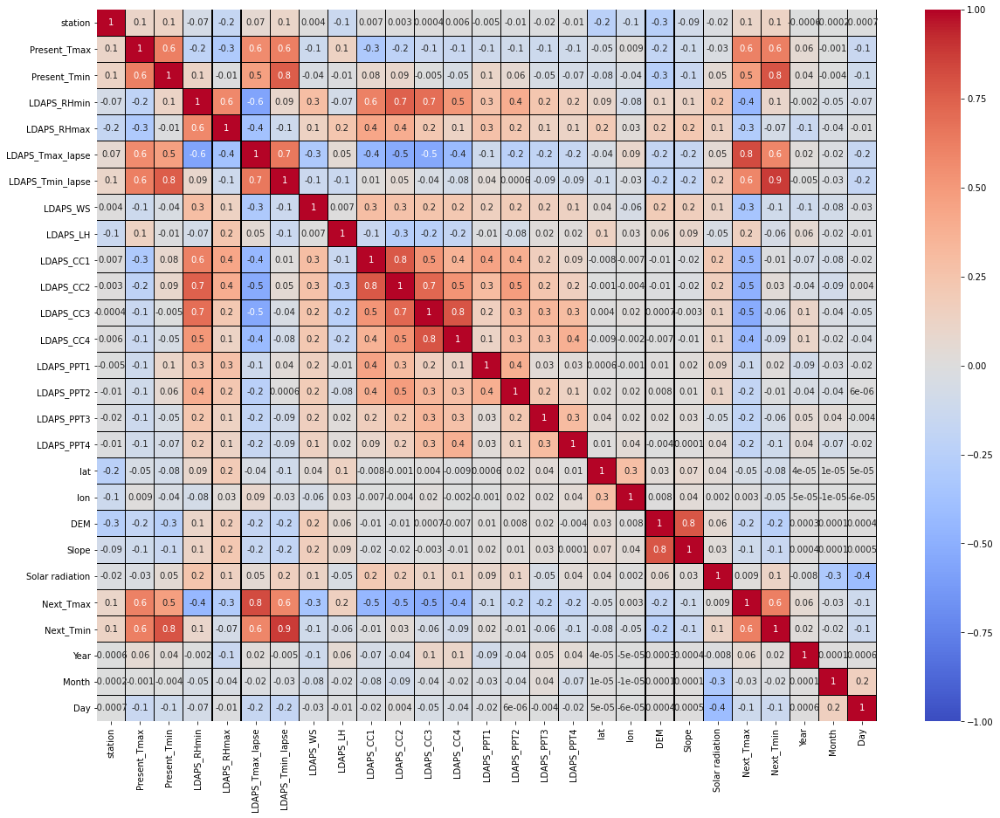

In [79]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(20,15))
sns.heatmap(df.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.1g', annot = True, linecolor="black",annot_kws={'size':10},cmap="coolwarm")
plt.yticks(rotation=0);

- By looking into the heat map i can say that there is multicolinearity issue.
- By looking into the correlation of target column with other features i can say that Next_Tmax has good correlation compared to Next_Tmin.
- **Let me plot a bar graph to get better insight on targets.**

# i) Prediction and model building for target Next_Tmax:

First let me consider Next_Tmax as target and build the model.

# Separating features and label:

In [80]:
x = df.drop("Next_Tmax",axis=1)
y = df["Next_Tmax"]

Assigned y as target variable and x as remaining features.

## Bar plot for correlations of Next_Tmax column with other features:

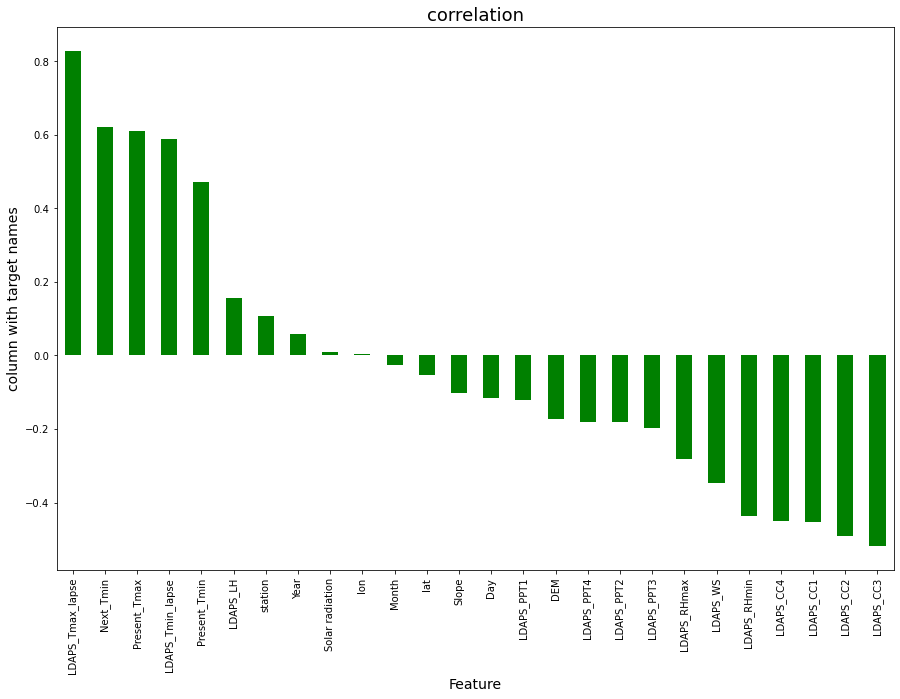

In [81]:
plt.figure(figsize=(15,10))
df.corr()['Next_Tmax'].sort_values(ascending=False).drop(['Next_Tmax']).plot(kind='bar',color='g')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('column with target names',fontsize=14)
plt.title('correlation',fontsize=18)
plt.show()

lon and Solar radiation has very less correlation with target Next_Tmax.

# Checking skewness:

In [82]:
#Checking for skewness
x.skew()

station             0.000182
Present_Tmax       -0.264137
Present_Tmin       -0.367538
LDAPS_RHmin         0.300220
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.227880
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            1.584975
LDAPS_LH            0.678315
LDAPS_CC1           0.459458
LDAPS_CC2           0.472350
LDAPS_CC3           0.646670
LDAPS_CC4           0.673700
LDAPS_PPT1          5.395178
LDAPS_PPT2          5.776835
LDAPS_PPT3          6.458608
LDAPS_PPT4          6.826930
lat                 0.087062
lon                -0.285213
DEM                 1.723257
Slope               1.563020
Solar radiation    -0.511210
Next_Tmin          -0.404447
Year               -0.000365
Month              -0.705586
Day                 0.245283
dtype: float64

The skewed columns are:
- LDAPS_RHmax
- LDAPS_Tmin_lapse
- LDAPS_WS
- LDAPS_LH
- LDAPS_CC3
- LDAPS_CC4
- LDAPS_PPT1
- LDAPS_PPT2
- LDAPS_PPT3
- LDAPS_PPT4
- DEM
- Slope
- Solar radiation
- Month

# Removing skewness using yeo-johnson:

In [83]:
#list of skewed features
skew_fea=['LDAPS_RHmax','LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_LH','LDAPS_CC3','LDAPS_CC4','LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4','DEM','Slope','Solar radiation','Month']

Taking all the columns with skewness as a list with variable skew_fea.

In [84]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box_cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box_cox' or 'yeo-johnson'\n"

Using yeo-johnson to remove skewness.

In [85]:
#Removing skewness using yeo-johnson
x[skew_fea] = scaler.fit_transform(x[skew_fea].values)

Using yeo-johnson i have removed the skewness.

In [86]:
#Checking skewness after removing skewness
x[skew_fea].skew()

LDAPS_RHmax        -0.116481
LDAPS_Tmin_lapse   -0.018120
LDAPS_WS            0.002449
LDAPS_LH            0.058865
LDAPS_CC3           0.089672
LDAPS_CC4           0.129826
LDAPS_PPT1          1.463941
LDAPS_PPT2          1.646417
LDAPS_PPT3          1.824919
LDAPS_PPT4          2.059400
DEM                 0.039456
Slope               0.233968
Solar radiation    -0.176636
Month               0.043780
dtype: float64

The skewness has been reduced in all the columns.I have tried working on log, log1p, sqrt, cbrt and box-cox i found Yeo-johnson as best method in all the methods the skewness is not reducing at all.So i found Yeo-johnson as best method.

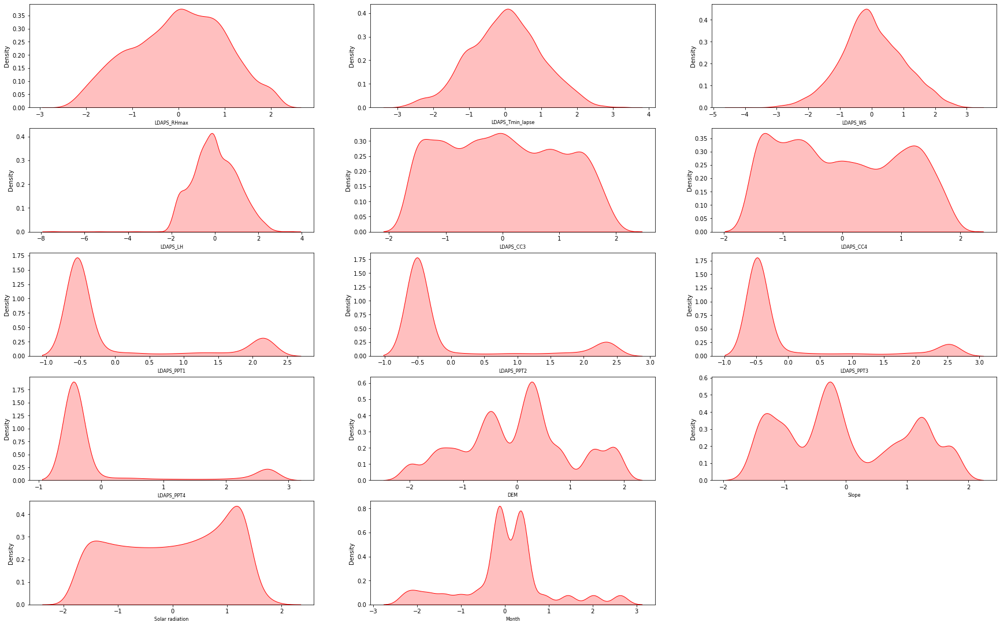

In [87]:
# After removing let's check how the data has been distributed in each column.

plt.figure(figsize=(30,35), facecolor='white')
plotnumber = 1

for column in x[skew_fea]:
    if plotnumber<=27:
        ax = plt.subplot(9,3,plotnumber)
        sns.distplot(x[column],color='r',kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=8)
    plotnumber+=1
plt.show()

Skewness has been reduced in most of the columns.

# Scaling the data using MinMax scaler:

In [88]:
#importing necessary libraries
from sklearn.preprocessing import MinMaxScaler

In [89]:
mms=MinMaxScaler()
X = pd.DataFrame(mms.fit_transform(x), columns=x.columns)

I have scaled my data using MinMax scaler since i haven't removed outliers and skewness completely from the dataset.

# Using VIF to remove multicolinearity:

In [90]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,4.535428,station
1,34.326786,Present_Tmax
2,87.573461,Present_Tmin
3,46.304936,LDAPS_RHmin
4,18.931767,LDAPS_RHmax
5,91.235502,LDAPS_Tmax_lapse
6,65.391863,LDAPS_Tmin_lapse
7,20.706292,LDAPS_WS
8,64.171809,LDAPS_LH
9,15.196003,LDAPS_CC1


In [91]:
#Droping highly VIF columns
X = X.drop(["Next_Tmin"],axis=1)

In [92]:
#Checking VIF again
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,4.534769,station
1,33.775211,Present_Tmax
2,77.650831,Present_Tmin
3,44.961529,LDAPS_RHmin
4,18.750713,LDAPS_RHmax
5,85.634325,LDAPS_Tmax_lapse
6,53.842800,LDAPS_Tmin_lapse
7,20.441734,LDAPS_WS
8,64.094992,LDAPS_LH
9,15.191476,LDAPS_CC1


In [93]:
#Droping highly VIF columns
X = X.drop(["LDAPS_Tmax_lapse"],axis=1)

In [94]:
#Checking VIF again
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,4.448455,station
1,33.514842,Present_Tmax
2,74.270762,Present_Tmin
3,32.144165,LDAPS_RHmin
4,18.587646,LDAPS_RHmax
5,29.540906,LDAPS_Tmin_lapse
6,20.406185,LDAPS_WS
7,50.196246,LDAPS_LH
8,15.077095,LDAPS_CC1
9,17.526319,LDAPS_CC2


In [95]:
#Droping highly VIF columns
X = X.drop(["Present_Tmin"],axis=1)

In [96]:
#Checking VIF again
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,4.422332,station
1,29.139375,Present_Tmax
2,32.124333,LDAPS_RHmin
3,18.146943,LDAPS_RHmax
4,20.074250,LDAPS_Tmin_lapse
5,19.820954,LDAPS_WS
6,48.036006,LDAPS_LH
7,14.853205,LDAPS_CC1
8,17.525836,LDAPS_CC2
9,17.701459,LDAPS_CC3


In [97]:
#Droping highly VIF columns
X = X.drop(["LDAPS_LH"],axis=1)

In [98]:
#Checking VIF again
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,4.357750,station
1,22.420439,Present_Tmax
2,31.898138,LDAPS_RHmin
3,15.012201,LDAPS_RHmax
4,19.565808,LDAPS_Tmin_lapse
5,17.942441,LDAPS_WS
6,14.506970,LDAPS_CC1
7,16.963098,LDAPS_CC2
8,17.584827,LDAPS_CC3
9,9.659758,LDAPS_CC4


In [99]:
#Droping highly VIF columns
X = X.drop(["LDAPS_RHmin"],axis=1)

In [100]:
#Checking VIF again
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,4.353489,station
1,21.959436,Present_Tmax
2,10.499715,LDAPS_RHmax
3,17.943622,LDAPS_Tmin_lapse
4,17.494162,LDAPS_WS
5,14.424490,LDAPS_CC1
6,15.972219,LDAPS_CC2
7,15.747872,LDAPS_CC3
8,9.644795,LDAPS_CC4
9,3.300489,LDAPS_PPT1


In [101]:
#Droping highly VIF columns
X = X.drop(["Present_Tmax"],axis=1)

In [102]:
#Checking VIF again
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,4.249027,station
1,10.494177,LDAPS_RHmax
2,8.455903,LDAPS_Tmin_lapse
3,16.864879,LDAPS_WS
4,13.559921,LDAPS_CC1
5,15.963881,LDAPS_CC2
6,15.656609,LDAPS_CC3
7,9.638630,LDAPS_CC4
8,3.270818,LDAPS_PPT1
9,2.956593,LDAPS_PPT2


In [103]:
#Droping highly VIF columns
X = X.drop(["LDAPS_WS"],axis=1)

In [104]:
#Checking VIF again
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,3.968764,station
1,10.436610,LDAPS_RHmax
2,7.862778,LDAPS_Tmin_lapse
3,13.491842,LDAPS_CC1
4,15.963879,LDAPS_CC2
5,15.636448,LDAPS_CC3
6,9.616443,LDAPS_CC4
7,3.269027,LDAPS_PPT1
8,2.955624,LDAPS_PPT2
9,2.200587,LDAPS_PPT3


In [105]:
#Droping highly VIF columns
X = X.drop(["LDAPS_CC2"],axis=1)

In [106]:
#Checking VIF again
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,3.968088,station
1,10.275045,LDAPS_RHmax
2,7.779405,LDAPS_Tmin_lapse
3,9.312590,LDAPS_CC1
4,12.846864,LDAPS_CC3
5,9.616340,LDAPS_CC4
6,3.072742,LDAPS_PPT1
7,2.322113,LDAPS_PPT2
8,2.199760,LDAPS_PPT3
9,2.027317,LDAPS_PPT4


In [107]:
#Droping highly VIF columns
X = X.drop(["DEM"],axis=1)

In [108]:
#Checking VIF again
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,3.680109,station
1,10.128386,LDAPS_RHmax
2,7.716922,LDAPS_Tmin_lapse
3,9.311825,LDAPS_CC1
4,12.843669,LDAPS_CC3
5,9.614301,LDAPS_CC4
6,3.068458,LDAPS_PPT1
7,2.318813,LDAPS_PPT2
8,2.199743,LDAPS_PPT3
9,2.027274,LDAPS_PPT4


In [109]:
#Droping highly VIF columns
X = X.drop(["LDAPS_CC3"],axis=1)

In [110]:
#Checking VIF again
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,3.680031,station
1,10.128315,LDAPS_RHmax
2,7.687641,LDAPS_Tmin_lapse
3,8.363750,LDAPS_CC1
4,5.068478,LDAPS_CC4
5,2.973010,LDAPS_PPT1
6,2.303686,LDAPS_PPT2
7,1.977942,LDAPS_PPT3
8,2.015596,LDAPS_PPT4
9,4.878332,lat


In [111]:
#Droping highly VIF columns
X = X.drop(["LDAPS_RHmax"],axis=1)

In [112]:
#Checking VIF again
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,3.680020,station
1,7.637569,LDAPS_Tmin_lapse
2,7.980586,LDAPS_CC1
3,5.057435,LDAPS_CC4
4,2.931576,LDAPS_PPT1
5,2.282662,LDAPS_PPT2
6,1.967399,LDAPS_PPT3
7,2.010568,LDAPS_PPT4
8,4.437019,lat
9,5.551137,lon


Now the multicolinearity issue has been solved.All the VIF values are below 10 it is acceptable.

# Finding Best Random State and Accuracy:

In [113]:
#importing necessary libraries
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split

In [114]:
from sklearn.ensemble import RandomForestRegressor
maxAccu=0
maxRS=0
for i in range(1,200):
    X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=.30, random_state =i)
    mod = RandomForestRegressor()
    mod.fit(X_train, y_train)
    pred = mod.predict(X_test)
    acc=r2_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.9176935694457173  on Random_state  6


I got the best accuracy and random state.

In [115]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.30,random_state=maxRS)

Created train test split.

# Regression Algorithms:


In [116]:
#importing necessary libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.linear_model import SGDRegressor
from xgboost import XGBRegressor
from sklearn.metrics import classification_report
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import BaggingRegressor
from sklearn import metrics

# i) RandomForestRegressor:

In [117]:
RFR=RandomForestRegressor()
RFR.fit(X_train,y_train)
pred=RFR.predict(X_test)
print('R2_score:',r2_score(y_test,pred))
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

R2_score: 0.9169918578167918
mean_squared_error: 0.8096128854407785
mean_absolute_error: 0.6671908700576296
root_mean_squared_error: 0.8997849106540843


RFR is giving me 91.74% r2_score.

# ii) XGB Regressor:

In [118]:
XGB=XGBRegressor()
XGB.fit(X_train,y_train)
pred=XGB.predict(X_test)
print('R2_score:',r2_score(y_test,pred))
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

R2_score: 0.9222328363935317
mean_squared_error: 0.7584954447121027
mean_absolute_error: 0.6644977525059513
root_mean_squared_error: 0.870916439569321


XGB is giving me 92.09% r2_score.

# iii) ExtraTreeRegressor:

In [119]:
ETR=ExtraTreesRegressor()
ETR.fit(X_train,y_train)
pred=ETR.predict(X_test)
print('R2_score:',r2_score(y_test,pred))
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

R2_score: 0.9250780373469778
mean_squared_error: 0.7307450181516058
mean_absolute_error: 0.6313733002752061
root_mean_squared_error: 0.8548362522446072


ETR is giving me 92.51% r2_score.

# iv) Gradient Boosting:

In [120]:
GBR=GradientBoostingRegressor()
GBR.fit(X_train,y_train)
pred=GBR.predict(X_test)
print('R2_score:',r2_score(y_test,pred))
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

R2_score: 0.8162134210763112
mean_squared_error: 1.7925468340116308
mean_absolute_error: 1.0299319549031576
root_mean_squared_error: 1.3388602742674947


GBR is giving me 82.06% r2_score.

# v) DecisionTreeRegressor:

In [121]:
DTR=DecisionTreeRegressor()
DTR.fit(X_train,y_train)
pred=DTR.predict(X_test)
print('R2_score:',r2_score(y_test,pred))
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

R2_score: 0.8005246209963034
mean_squared_error: 1.9455662170240131
mean_absolute_error: 0.9755264117183825
root_mean_squared_error: 1.3948355519644648


DTR is giving me 80.60% r2_score.

# vi) KNN:

In [122]:
knn=KNN()
knn.fit(X_train,y_train)
pred=knn.predict(X_test)
print('R2_score:',r2_score(y_test,pred))
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

R2_score: 0.7672597098224013
mean_squared_error: 2.270012711200365
mean_absolute_error: 1.1459071367153912
root_mean_squared_error: 1.5066561356860315


KNN is giving me 77.67% r2_score.

# Cross validation score:


In [123]:
print(cross_val_score(RFR,X,y,cv=5).mean())

0.9075177498169046


In [124]:
print(cross_val_score(XGB,X,y,cv=5).mean())

0.91494075914683


In [125]:
print(cross_val_score(ETR,X,y,cv=5).mean())

0.916732496105922


In [126]:
print(cross_val_score(GBR,X,y,cv=5).mean())

0.7981184354039336


In [127]:
print(cross_val_score(DTR,X,y,cv=5).mean())

0.7837517618678819


In [128]:
print(cross_val_score(knn,X,y,cv=5).mean())

0.7671871061544713


Above are the cross validation scores of RFR,XGB,ETR,GBR,DTR and KNN.

Difference between the model accuracy and cross validation score are:
- RFR - 0.93%
- XGB - 0.53%
- ETR - 0.88%
- GBR - 2.02%
- DTR - 2.31%
- KNN - 1.38%

By looking into the difference of model accuracy and cross validation score i got least difference for XGB.So XGB is my best model.And i have to tune it to get better accuracy.

# Hyper parameter tuning:

In [129]:
#importing necessary libraries
from sklearn.model_selection import GridSearchCV

In [130]:
parameter = {'gamma':np.arange(0,0.5,0.1),
             'n_estimators':[10,100,1000],
             'max_depth': [4,6,8,10],
              'n_jobs':[-2,-1,1]}

Giving XGB parameters.

In [131]:
GCV=GridSearchCV(XGBRegressor(verbosity=0),parameter,cv=5)

Running grid search CV for XGB.

In [132]:
GCV.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, gamma=None,
                                    gpu_id=None, importance_type='gain',
                                    interaction_constraints=None,
                                    learning_rate=None, max_delta_step=None,
                                    max_depth=None, min_child_weight=None,
                                    missing=nan, monotone_constraints=None,
                                    n_estimators=100, n_jobs=None,
                                    num_parallel_tree=None, random_state=None,
                                    reg_alpha=None, reg_lambda=None,
                                    scale_pos_weight=None, subsample=None,
                                    tree_method=None, validate_para

Tunning the model using GCV.

In [133]:
GCV.best_params_

{'gamma': 0.0, 'max_depth': 6, 'n_estimators': 1000, 'n_jobs': -2}

Got the best parameters for XGB.

In [134]:
Best_mod=XGBRegressor(gamma=0.0,max_depth=6,n_estimators=1000,n_jobs=-2)
Best_mod.fit(X_train,y_train)
pred=Best_mod.predict(X_test)
print('R2_Score:',r2_score(y_test,pred)*100)
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print("RMSE value:",np.sqrt(metrics.mean_squared_error(y_test, pred)))

R2_Score: 92.49328053521263
mean_squared_error: 0.7321615261147715
mean_absolute_error: 0.6487688266058323
RMSE value: 0.8556643770280328


This is my model after tuning.I got 92.51% as r2_score which is gooddd!!!!

# Saving the model:

In [135]:
# Saving the model using .pkl
import joblib
joblib.dump(Best_mod,"Next_Tmax.pkl")

['Next_Tmax.pkl']

I have saved my model as Next_Tmax.Using .pkl

# Predictions for Next_Tmax:

In [136]:
# Loading the saved model
model=joblib.load("Next_Tmax.pkl")

#Prediction
prediction = model.predict(X_test)
prediction

array([29.9253  , 26.817291, 29.705791, ..., 27.780142, 34.487595,
       29.613594], dtype=float32)

In [137]:
pd.DataFrame([model.predict(X_test)[:],y_test[:]],index=["Predicted","Actual"])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

Above are the predicted values and the actual values.They are almost similar.

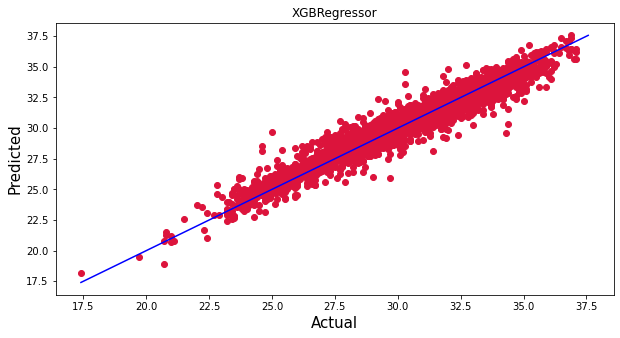

In [138]:
plt.figure(figsize=(10,5))
plt.scatter(y_test, prediction, c='crimson')
p1 = max(max(prediction), max(y_test))
p2 = min(min(prediction), min(y_test))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.xlabel('Actual', fontsize=15)
plt.ylabel('Predicted', fontsize=15)
plt.title("XGBRegressor")
plt.show()

Plotting Actual vs Predicted,To get better insight.Bule line is the actual line and red dots are the predicted values.

# ii) Prediction and model building for target Next_Tmin:

Now let me consider Next_Tmin as target and build the model.

# Separating features and label:

In [139]:
x_1 = df.drop("Next_Tmin",axis=1)
y_1 = df["Next_Tmin"]

Assigned y_1 as target variable and x_1 as remaining features.

# Bar plot for correlations of Next_Tmin column with other features:

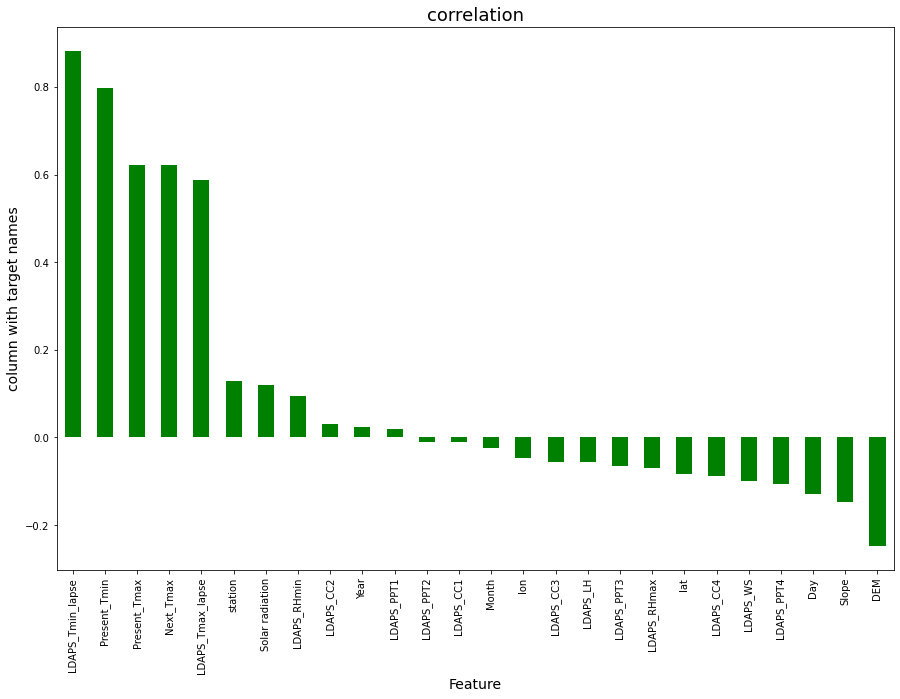

In [140]:
plt.figure(figsize=(15,10))
df.corr()['Next_Tmin'].sort_values(ascending=False).drop(['Next_Tmin']).plot(kind='bar',color='g')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('column with target names',fontsize=14)
plt.title('correlation',fontsize=18)
plt.show()

lon and Solar radiation has very less correlation with target Next_Tmax.

# Checking skewness:

In [141]:
#Checking for skewness
x_1.skew()

station             0.000182
Present_Tmax       -0.264137
Present_Tmin       -0.367538
LDAPS_RHmin         0.300220
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.227880
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            1.584975
LDAPS_LH            0.678315
LDAPS_CC1           0.459458
LDAPS_CC2           0.472350
LDAPS_CC3           0.646670
LDAPS_CC4           0.673700
LDAPS_PPT1          5.395178
LDAPS_PPT2          5.776835
LDAPS_PPT3          6.458608
LDAPS_PPT4          6.826930
lat                 0.087062
lon                -0.285213
DEM                 1.723257
Slope               1.563020
Solar radiation    -0.511210
Next_Tmax          -0.340200
Year               -0.000365
Month              -0.705586
Day                 0.245283
dtype: float64

The skewed columns are:

- LDAPS_RHmax
- LDAPS_Tmin_lapse
- LDAPS_WS
- LDAPS_LH
- LDAPS_CC3
- LDAPS_CC4
- LDAPS_PPT1
- LDAPS_PPT2
- LDAPS_PPT3
- LDAPS_PPT4
- DEM
- Slope
- Solar radiation
- Month

# Removing skewness using yeo-johnson:

In [142]:
#list of skewed features
skew_fea=['LDAPS_RHmax','LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_LH','LDAPS_CC3','LDAPS_CC4','LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4','DEM','Slope','Solar radiation','Month']

Taking all the columns with skewness as a list with variable skew_fea.

In [143]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box_cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box_cox' or 'yeo-johnson'\n"

Using yeo-johnson to remove skewness.

In [144]:
#Removing skewness using yeo-johnson
x_1[skew_fea] = scaler.fit_transform(x_1[skew_fea].values)

Using yeo-johnson i have removed the skewness.

In [145]:
#Checking skewness after removing skewness
x_1[skew_fea].skew()

LDAPS_RHmax        -0.116481
LDAPS_Tmin_lapse   -0.018120
LDAPS_WS            0.002449
LDAPS_LH            0.058865
LDAPS_CC3           0.089672
LDAPS_CC4           0.129826
LDAPS_PPT1          1.463941
LDAPS_PPT2          1.646417
LDAPS_PPT3          1.824919
LDAPS_PPT4          2.059400
DEM                 0.039456
Slope               0.233968
Solar radiation    -0.176636
Month               0.043780
dtype: float64

The skewness has been reduced in all the columns.

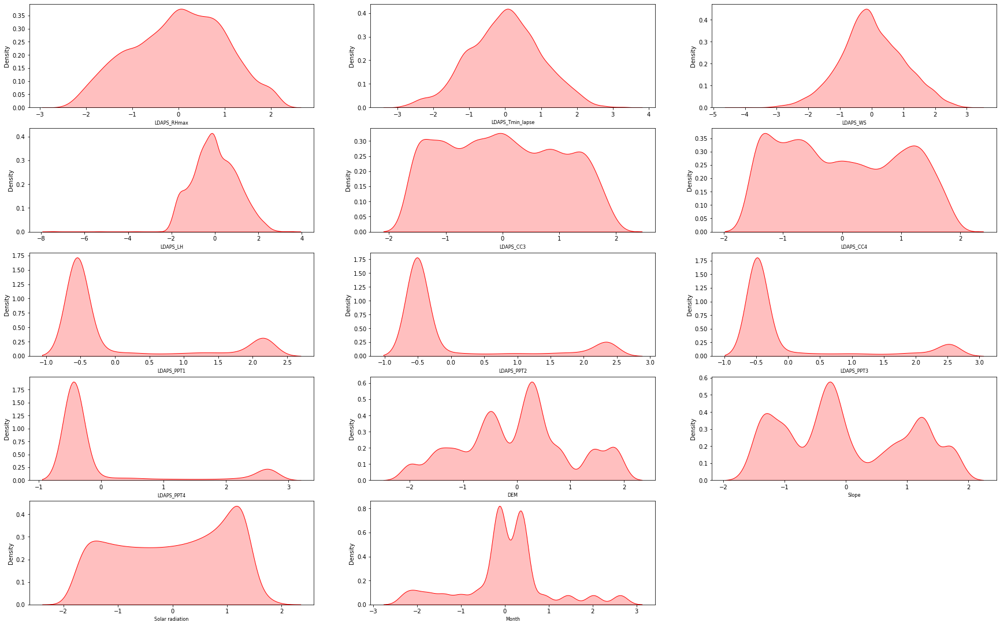

In [146]:
# After removing let's check how the data has been distributed in each column.

plt.figure(figsize=(30,35), facecolor='white')
plotnumber = 1

for column in x_1[skew_fea]:
    if plotnumber<=27:
        ax = plt.subplot(9,3,plotnumber)
        sns.distplot(x_1[column],color='r',kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=8)
    plotnumber+=1
plt.show()

Skewness has been reduced in most of the columns.

# Scaling the data using MinMax scaler:

In [147]:
#importing necessary libraries
from sklearn.preprocessing import MinMaxScaler

In [148]:
mms=MinMaxScaler()
X_1 = pd.DataFrame(mms.fit_transform(x_1), columns=x_1.columns)

I have scaled my data using MinMax scaler since i haven't removed outliers and skewness completely from the dataset.

# Using VIF to remove multicolinearity:

In [149]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X_1.values, i) for i in range(X_1.shape[1])]
vif["Features"]=X_1.columns
vif

,vif_Features,Features
0,4.598736,station
1,35.154944,Present_Tmax
2,78.080026,Present_Tmin
3,45.986393,LDAPS_RHmin
4,18.751390,LDAPS_RHmax
5,120.720770,LDAPS_Tmax_lapse
6,53.866135,LDAPS_Tmin_lapse
7,20.862029,LDAPS_WS
8,65.951880,LDAPS_LH
9,15.227578,LDAPS_CC1


In [150]:
#Droping highly VIF columns
X_1 = X_1.drop(["LDAPS_Tmax_lapse"],axis=1)

In [151]:
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X_1.values, i) for i in range(X_1.shape[1])]
vif["Features"]=X_1.columns
vif

,vif_Features,Features
0,4.586394,station
1,34.024946,Present_Tmax
2,76.651388,Present_Tmin
3,33.305067,LDAPS_RHmin
4,18.645062,LDAPS_RHmax
5,35.936728,LDAPS_Tmin_lapse
6,20.603654,LDAPS_WS
7,60.166409,LDAPS_LH
8,15.194305,LDAPS_CC1
9,17.548304,LDAPS_CC2


In [152]:
#Droping highly VIF columns
X_1 = X_1.drop(["Present_Tmin"],axis=1)

In [153]:
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X_1.values, i) for i in range(X_1.shape[1])]
vif["Features"]=X_1.columns
vif

,vif_Features,Features
0,4.577625,station
1,30.287860,Present_Tmax
2,33.197151,LDAPS_RHmin
3,18.271453,LDAPS_RHmax
4,29.265116,LDAPS_Tmin_lapse
5,19.912521,LDAPS_WS
6,59.373761,LDAPS_LH
7,14.917525,LDAPS_CC1
8,17.546022,LDAPS_CC2
9,17.732365,LDAPS_CC3


In [154]:
#Droping highly VIF columns
X_1 = X_1.drop(["LDAPS_LH"],axis=1)

In [155]:
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X_1.values, i) for i in range(X_1.shape[1])]
vif["Features"]=X_1.columns
vif

,vif_Features,Features
0,4.574447,station
1,26.816344,Present_Tmax
2,32.422043,LDAPS_RHmin
3,16.202650,LDAPS_RHmax
4,25.399373,LDAPS_Tmin_lapse
5,18.049204,LDAPS_WS
6,14.507811,LDAPS_CC1
7,17.170673,LDAPS_CC2
8,17.679300,LDAPS_CC3
9,9.675928,LDAPS_CC4


In [156]:
#Droping highly VIF columns
X_1 = X_1.drop(["Next_Tmax"],axis=1)

In [157]:
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X_1.values, i) for i in range(X_1.shape[1])]
vif["Features"]=X_1.columns
vif

,vif_Features,Features
0,4.357750,station
1,22.420439,Present_Tmax
2,31.898138,LDAPS_RHmin
3,15.012201,LDAPS_RHmax
4,19.565808,LDAPS_Tmin_lapse
5,17.942441,LDAPS_WS
6,14.506970,LDAPS_CC1
7,16.963098,LDAPS_CC2
8,17.584827,LDAPS_CC3
9,9.659758,LDAPS_CC4


In [158]:
#Droping highly VIF columns
X_1 = X_1.drop(["LDAPS_RHmin"],axis=1)

In [159]:
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X_1.values, i) for i in range(X_1.shape[1])]
vif["Features"]=X_1.columns
vif

,vif_Features,Features
0,4.353489,station
1,21.959436,Present_Tmax
2,10.499715,LDAPS_RHmax
3,17.943622,LDAPS_Tmin_lapse
4,17.494162,LDAPS_WS
5,14.424490,LDAPS_CC1
6,15.972219,LDAPS_CC2
7,15.747872,LDAPS_CC3
8,9.644795,LDAPS_CC4
9,3.300489,LDAPS_PPT1


In [160]:
#Droping highly VIF columns
X_1 = X_1.drop(["Present_Tmax"],axis=1)

In [161]:
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X_1.values, i) for i in range(X_1.shape[1])]
vif["Features"]=X_1.columns
vif

,vif_Features,Features
0,4.249027,station
1,10.494177,LDAPS_RHmax
2,8.455903,LDAPS_Tmin_lapse
3,16.864879,LDAPS_WS
4,13.559921,LDAPS_CC1
5,15.963881,LDAPS_CC2
6,15.656609,LDAPS_CC3
7,9.638630,LDAPS_CC4
8,3.270818,LDAPS_PPT1
9,2.956593,LDAPS_PPT2


In [162]:
#Droping highly VIF columns
X_1 = X_1.drop(["LDAPS_WS"],axis=1)

In [163]:
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X_1.values, i) for i in range(X_1.shape[1])]
vif["Features"]=X_1.columns
vif

,vif_Features,Features
0,3.968764,station
1,10.436610,LDAPS_RHmax
2,7.862778,LDAPS_Tmin_lapse
3,13.491842,LDAPS_CC1
4,15.963879,LDAPS_CC2
5,15.636448,LDAPS_CC3
6,9.616443,LDAPS_CC4
7,3.269027,LDAPS_PPT1
8,2.955624,LDAPS_PPT2
9,2.200587,LDAPS_PPT3


In [164]:
#Droping highly VIF columns
X_1 = X_1.drop(["LDAPS_CC2"],axis=1)

In [165]:
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X_1.values, i) for i in range(X_1.shape[1])]
vif["Features"]=X_1.columns
vif

,vif_Features,Features
0,3.968088,station
1,10.275045,LDAPS_RHmax
2,7.779405,LDAPS_Tmin_lapse
3,9.312590,LDAPS_CC1
4,12.846864,LDAPS_CC3
5,9.616340,LDAPS_CC4
6,3.072742,LDAPS_PPT1
7,2.322113,LDAPS_PPT2
8,2.199760,LDAPS_PPT3
9,2.027317,LDAPS_PPT4


In [166]:
#Droping highly VIF columns
X_1 = X_1.drop(["DEM"],axis=1)

In [167]:
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X_1.values, i) for i in range(X_1.shape[1])]
vif["Features"]=X_1.columns
vif

,vif_Features,Features
0,3.680109,station
1,10.128386,LDAPS_RHmax
2,7.716922,LDAPS_Tmin_lapse
3,9.311825,LDAPS_CC1
4,12.843669,LDAPS_CC3
5,9.614301,LDAPS_CC4
6,3.068458,LDAPS_PPT1
7,2.318813,LDAPS_PPT2
8,2.199743,LDAPS_PPT3
9,2.027274,LDAPS_PPT4


In [168]:
#Droping highly VIF columns
X_1 = X_1.drop(["LDAPS_CC3"],axis=1)

In [169]:
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X_1.values, i) for i in range(X_1.shape[1])]
vif["Features"]=X_1.columns
vif

,vif_Features,Features
0,3.680031,station
1,10.128315,LDAPS_RHmax
2,7.687641,LDAPS_Tmin_lapse
3,8.363750,LDAPS_CC1
4,5.068478,LDAPS_CC4
5,2.973010,LDAPS_PPT1
6,2.303686,LDAPS_PPT2
7,1.977942,LDAPS_PPT3
8,2.015596,LDAPS_PPT4
9,4.878332,lat


In [170]:
#Droping highly VIF columns
X_1 = X_1.drop(["LDAPS_RHmax"],axis=1)

In [171]:
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X_1.values, i) for i in range(X_1.shape[1])]
vif["Features"]=X_1.columns
vif

,vif_Features,Features
0,3.680020,station
1,7.637569,LDAPS_Tmin_lapse
2,7.980586,LDAPS_CC1
3,5.057435,LDAPS_CC4
4,2.931576,LDAPS_PPT1
5,2.282662,LDAPS_PPT2
6,1.967399,LDAPS_PPT3
7,2.010568,LDAPS_PPT4
8,4.437019,lat
9,5.551137,lon


Now the multicolinearity issue has solved.All the VIF values are below 10 it is acceptable.

# Finding Best Random State and Accuracy:

In [172]:
#importing necessary libraries
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split

In [173]:
from sklearn.ensemble import RandomForestRegressor
maxAccu=0
maxRS=0
for i in range(1,200):
    X_train,X_test,y_train,y_test = train_test_split(X_1,y_1,test_size=.30, random_state =i)
    mod = RandomForestRegressor()
    mod.fit(X_train, y_train)
    pred = mod.predict(X_test)
    acc=r2_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.9018121751263929  on Random_state  77


I got the best accuracy and random state.

In [174]:
X_train,X_test,y_train,y_test=train_test_split(X_1,y_1,test_size=.30,random_state=maxRS)

Created train test split.

# Regression Algorithms:

In [175]:
#importing necessary libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.linear_model import SGDRegressor
from xgboost import XGBRegressor
from sklearn.metrics import classification_report
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import BaggingRegressor
from sklearn import metrics

# i) RandomForestRegressor:

In [176]:
RFR=RandomForestRegressor()
RFR.fit(X_train,y_train)
pred=RFR.predict(X_test)
print('R2_score:',r2_score(y_test,pred))
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

R2_score: 0.9023686503690777
mean_squared_error: 0.6123005599500405
mean_absolute_error: 0.6008846388232645
root_mean_squared_error: 0.7824963641768826


RFR is giving me 90.23% r2_score.

# ii) XGB Regressor:

In [177]:
XGB=XGBRegressor()
XGB.fit(X_train,y_train)
pred=XGB.predict(X_test)
print('R2_score:',r2_score(y_test,pred))
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

R2_score: 0.941119850583629
mean_squared_error: 0.36927020464098215
mean_absolute_error: 0.4590775195477696
root_mean_squared_error: 0.6076760688401199


XGB is giving me 94.11% r2_score.

# iii) ExtraTreeRegressor:

In [178]:
ETR=ExtraTreesRegressor()
ETR.fit(X_train,y_train)
pred=ETR.predict(X_test)
print('R2_score:',r2_score(y_test,pred))
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

R2_score: 0.9161372562839875
mean_squared_error: 0.5259499651533812
mean_absolute_error: 0.5537247430621067
root_mean_squared_error: 0.7252240792702496


ETR is giving me 91.61% r2_score.

# iv) Gradient Boosting:

In [179]:
GBR=GradientBoostingRegressor()
GBR.fit(X_train,y_train)
pred=GBR.predict(X_test)
print('R2_score:',r2_score(y_test,pred))
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

R2_score: 0.8873134942576213
mean_squared_error: 0.7067198274499573
mean_absolute_error: 0.6485648355743944
root_mean_squared_error: 0.8406662996992073


GBR is giving me 88.73% r2_score.

# v) DecisionTreeRegressor:

In [180]:
DTR=DecisionTreeRegressor()
DTR.fit(X_train,y_train)
pred=DTR.predict(X_test)
print('R2_score:',r2_score(y_test,pred))
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

R2_score: 0.7580538104809891
mean_squared_error: 1.517379283194381
mean_absolute_error: 0.9212840411056107
root_mean_squared_error: 1.2318195010610853


DTR is giving me 75.80% r2_score.

# vi) KNN:

In [181]:
knn=KNN()
knn.fit(X_train,y_train)
pred=knn.predict(X_test)
print('R2_score:',r2_score(y_test,pred))
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

R2_score: 0.7767491172596283
mean_squared_error: 1.4001306038278414
mean_absolute_error: 0.9081000292180419
root_mean_squared_error: 1.1832711455232234


KNN is giving me 77.67% r2_score.

# Cross validation score:

In [182]:
print(cross_val_score(RFR,X,y,cv=5).mean())

0.9074373013845538


In [183]:
print(cross_val_score(XGB,X,y,cv=5).mean())

0.91494075914683


In [184]:
print(cross_val_score(ETR,X,y,cv=5).mean())

0.9166409469630274


In [185]:
print(cross_val_score(GBR,X,y,cv=5).mean())

0.7981330365345023


In [186]:
print(cross_val_score(DTR,X,y,cv=5).mean())

0.7832412989796668


In [187]:
print(cross_val_score(knn,X,y,cv=5).mean())

0.7671871061544713


Above are the cross validation scores of RFR,XGB,ETR,GBR,DTR and KNN.

By looking into the difference of model accuracy and cross validation score i got least difference for XGB.So XGB is my best model.And i have to tune it to get better accuracy.

# Hyper parameter tuning:

In [188]:
#importing necessary libraries
from sklearn.model_selection import GridSearchCV

In [189]:
parameter = {'gamma':np.arange(0,0.5,0.1),
             'n_estimators':[10,100,1000],
             'max_depth': [4,6,8,10],
              'n_jobs':[-2,-1,1]}

Giving XGB parameters.

In [190]:
GCV=GridSearchCV(XGBRegressor(verbosity=0),parameter,cv=5)

Running grid search CV for XGB.

In [191]:
GCV.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, gamma=None,
                                    gpu_id=None, importance_type='gain',
                                    interaction_constraints=None,
                                    learning_rate=None, max_delta_step=None,
                                    max_depth=None, min_child_weight=None,
                                    missing=nan, monotone_constraints=None,
                                    n_estimators=100, n_jobs=None,
                                    num_parallel_tree=None, random_state=None,
                                    reg_alpha=None, reg_lambda=None,
                                    scale_pos_weight=None, subsample=None,
                                    tree_method=None, validate_para

Tunning the model using GCV.

In [192]:
GCV.best_params_

{'gamma': 0.0, 'max_depth': 6, 'n_estimators': 1000, 'n_jobs': -2}

Got the best parameters for XGB.

In [193]:
Best_mod_1=XGBRegressor(gamma=0.0,max_depth=6,n_estimators=1000,n_jobs=-2)
Best_mod_1.fit(X_train,y_train)
pred=Best_mod_1.predict(X_test)
print('R2_Score:',r2_score(y_test,pred)*100)
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print("RMSE value:",np.sqrt(metrics.mean_squared_error(y_test, pred)))

R2_Score: 94.37690052472328
mean_squared_error: 0.3526558805529628
mean_absolute_error: 0.4442616024875933
RMSE value: 0.5938483649493049


This is my model after tuning.I got 93.96% as r2_score which is gooddd!!!!

# Saving the model:

In [194]:
# Saving the model using .pkl
import joblib
joblib.dump(Best_mod_1,"Next_Tmin.pkl")

['Next_Tmin.pkl']

I have saved my model as Next_Tmin.Using .pkl

# Predictions for Next_Tmax:

In [195]:
# Loading the saved model
model_1=joblib.load("Next_Tmin.pkl")

#Prediction
prediction_1 = model_1.predict(X_test)
prediction_1

array([23.49747 , 22.037493, 21.892086, ..., 20.931957, 25.39721 ,
       25.089216], dtype=float32)

In [196]:
pd.DataFrame([model_1.predict(X_test)[:],y_test[:]],index=["Predicted","Actual"])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

Above are the predicted values and the actual values.They are almost similar.

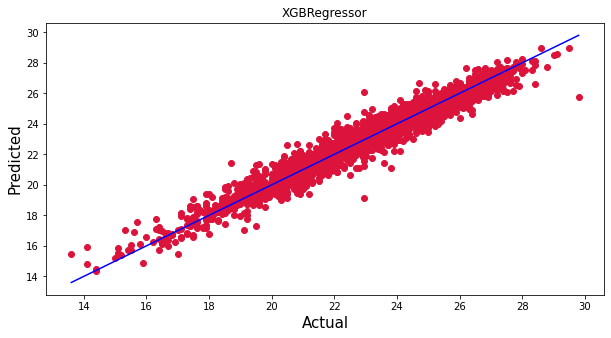

In [197]:
plt.figure(figsize=(10,5))
plt.scatter(y_test, prediction_1, c='crimson')
p1 = max(max(prediction_1), max(y_test))
p2 = min(min(prediction_1), min(y_test))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.xlabel('Actual', fontsize=15)
plt.ylabel('Predicted', fontsize=15)
plt.title("XGBRegressor")
plt.show()

Plotting Actual vs Predicted,To get better insight.Bule line is the actual line and red dots are the predicted values.

# Conclusion:

- XGBRegressor was my best model for predicting Next_Tmax and the best accuracy for this model was 92.51%.
- XGBRegressor was my best model for predicting Next_Tmin and the best accuracy for this model was 93.96%.